# Машинное обучение, DS-поток, осень 2024
## Задание ML.13


**Правила:**

* Дедлайны см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* В каждой задаче не забывайте делать **пояснения и выводы**.

**Баллы за задание**  
Задача 1 &mdash; **185 баллов**

Всего &mdash; **185 баллов**  

In [1]:
# Bot check

# HW_ID: ds_ml13
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

In [2]:
import numpy as np
import os
import pandas as pd
import time
from collections import defaultdict

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
import seaborn as sns
sns.set(palette='Set2')

import albumentations as A
from torchvision import transforms

import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from torchmetrics.detection.mean_ap import MeanAveragePrecision
device = "cuda" if torch.cuda.is_available() else "cpu"

**Перед вами последнее задание в этом семестре по нейронным сетям!** Хорошие новости: вам не придется возиться с данными, вся обработка вам дана. Более того, вам дан репозиторий с реализацией модели. Но задание немаленькое &mdash; нужно обучить модель на данных, реализовать визуализацию, подсчет метрики, потом немного изменить архитектуру и обучить модель еще раз. Будет интересно!

## Задача 1. Single Shot Multibox Detector (SSD)

Вам предстоит применить [реализацию SSD](https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Object-Detection) для [датасета с игральными картами](https://github.com/EdjeElectronics/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10), а также исследовать некоторые свойства модели: проверить, как модель ведет себя на более мелких картинках и попробовать изменить модель так, чтобы качество стало лучше.

**Как оформить работу**  
Скорее всего вам будет удобнее работать с моделью через модули. В таком случае **все измененные используемые файлы отправляйте в бот** (в ноутбуке явно поясните, что вы изменяли и где). Иначе пишите измененные функции прямо в ноутбуке. В коде указывайте, где изменения, с помощью комментов.

---

#### 1. Данные



Скачаем данные с github.

In [25]:
!git clone https://github.com/EdjeElectronics/TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10.git
!cp -r "TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/images" .
!rm -r "TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10"

Cloning into 'TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10'...
remote: Enumerating objects: 1235, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 1235 (delta 17), reused 24 (delta 8), pack-reused 1199 (from 1)
Receiving objects: 100% (1235/1235), 57.70 MiB | 3.52 MiB/s, done.
Resolving deltas: 100% (627/627), done.
rm: remove write-protected regular file 'TensorFlow-Object-Detection-API-Tutorial-Train-Multiple-Objects-Windows-10/.git/objects/pack/pack-4e8a46c3736a5c14a590266ecf8352fc59b1d13e.pack'? ^C


В папке `images` содержатся папки с изображениями для обучения и тестирования: `train` и `test` соответственно. Также в `images` есть таблицы с классами и
координатами ограничивающих прямоугольников `train_labels.csv` и `test_labels.csv`. Рассмотрим одну из таблиц с разметкой.

In [3]:
data = pd.read_csv("images/train_labels.csv")
data.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,cam_image1.jpg,480,270,queen,173,24,260,137
1,cam_image1.jpg,480,270,queen,165,135,253,251
2,cam_image1.jpg,480,270,ten,255,96,337,208
3,cam_image10.jpg,960,540,ten,501,116,700,353
4,cam_image10.jpg,960,540,queen,261,124,453,370


Сразу заметим, что картинки в датасете разного размера.

Определим функцию, которая по названию файла выдает лейбл и координаты боксов.

In [4]:
def get_file_labels_boxes(data, file):
    """
    Функция, которая по названию файла выдает лейбл и координаты боксов.
    Аргументы:
      data -- датафрейм с данными;
      file -- название файла.
    Возвращает:
      labels и boxes -- лейблы классов и координаты боксов
      в формате xmin, ymin, xmax, ymax.
    """
    part_data = data.where(data["filename"] == file).dropna(how='any', axis=0)
    labels = [class2label[class_] for class_ in part_data["class"].values]
    boxes = part_data[["xmin", "ymin", "xmax", "ymax"]].values
    return labels, boxes

Всего в данных 6 классов карт. Добавим к ним класс фона `bg`. Он понадобится нам для работы с SSD.

In [5]:
n_classes = 7
classes = ['bg', 'nine', 'ten', 'jack', 'queen', 'king', 'ace', 'bg',]
class2label = {'bg': 0, 'nine': 1, 'ten': 2, 'jack': 3, 'queen': 4, 'king': 5, 'ace': 6}

Посмотрим как выглядят наши данные в целом. Визуализируем картинки и соответствующие им боксы. Для этого будем использовать следующую функцию отрисовки. Вы можете далее изменять ее как вам будет удобнее.

In [6]:
def plot_boxes(
    boxes, labels, classes, ax, edgecolor='red', scores=None, threshold=None
    ):
    """
    Функция отрисовки bounding box-ов в задаче детекции.
    Аргументы:
      boxes -- массив боксов, которые задаются координатами
      xmin, ymin, xmax, ymax;
      labels -- лейблы классов;
      scores -- уверенность модели в детекции боксов;
      threshold -- порог отсечения боксов по threshold;
      ax -- полотно, на котором отображена исходная картинка.
    """

    box_kwargs = dict(linewidth=2, fill=False, edgecolor=edgecolor, facecolor='none')
    bbox = dict(facecolor='white', alpha=0.5)
    annot_kwargs = dict(color='black', size=14, bbox=bbox)

    for i, box in enumerate(boxes):

        if (scores is not None) and (threshold is not None) and (scores[i] < threshold):
            continue

        left_x, top_y, right_x, bottom_y = box
        width = right_x - left_x + 1
        height = bottom_y - top_y + 1

        # Прямоугольная рамка
        box_patch = Rectangle((left_x, top_y), width=width, height=height, **box_kwargs)
        # Добавляем рамку к изображению
        ax.add_patch(box_patch)

        # Добавляем текст к фото справа сверху от рамки
        if scores is not None:
            ax.text(left_x, top_y, f"{classes[labels[i]]}, {scores[i]:.2f}", **annot_kwargs)
        else:
            ax.text(left_x, top_y, f"{classes[labels[i]]}", **annot_kwargs)

Визуализируем 20 картинок из тренировочных данных.

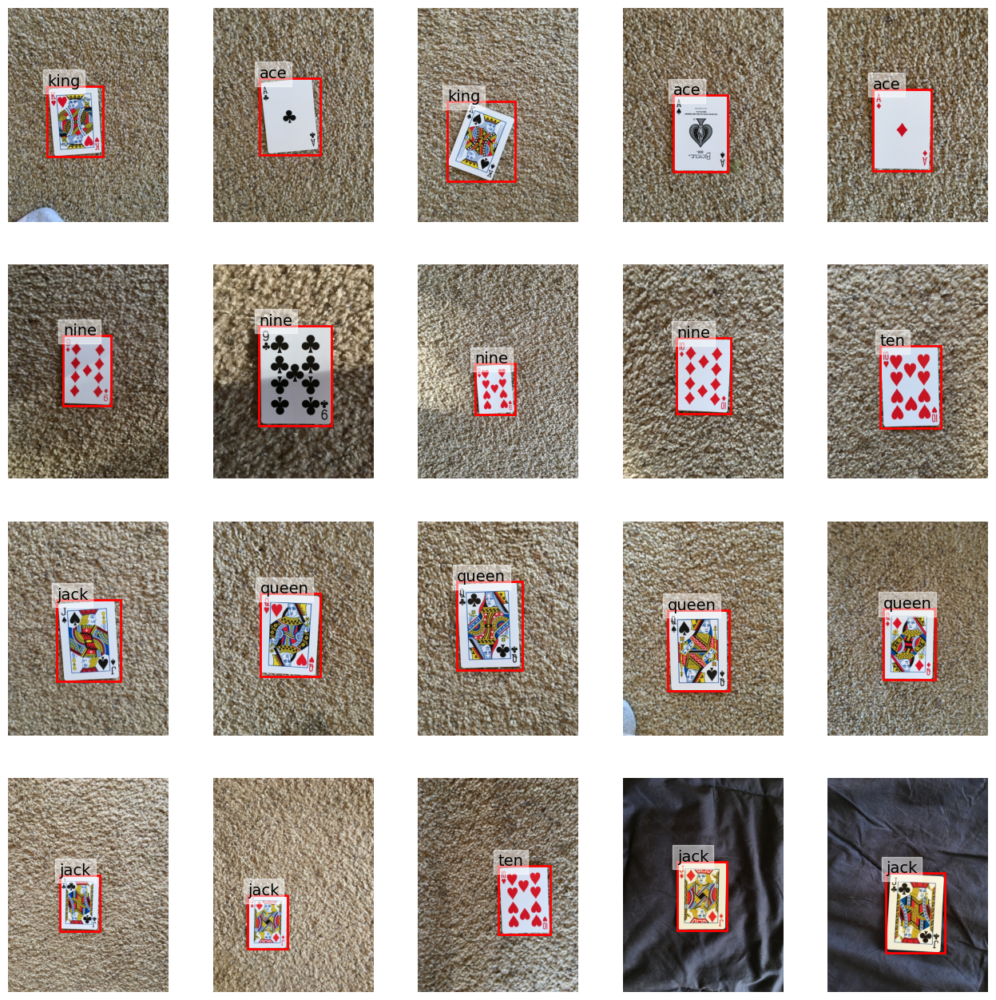

In [7]:
files = os.listdir("images/train")

fig, axes = plt.subplots(4, 5, figsize=(16, 16))

# Итератор по изображениям
i = 0
# Итератор по файлам
j = 0
while i < 20:

    file = files[j]
    j += 1

    # Выбираем только картинки
    if file[-4:].lower() != ".jpg":
        continue
    img = Image.open(os.path.join("images/train", file))

    # Получаем лейблы и боксы, соотв. картинке
    labels, boxes = get_file_labels_boxes(data, file)

    # Визуализируем
    ax = axes[i // 5, i % 5]
    ax.imshow(img)
    plot_boxes(boxes, labels, classes, ax)
    ax.axis("off")

    i += 1

Для модели SSD300 нужны на вход картинки размера 300 x 300. Причем здесь нам не помогут разные трансформации из `torchvision.transforms`, так как нам нужно изменять еще и боксы. К нам в помощь приходит библиотека [Albumentations](https://albumentations.ai/docs/). Подробнее посмотреть как работать с библиотекой в случае детекции можно [тут](https://albumentations.ai/docs/examples/example_bboxes/).

Для того, чтобы обрезать картинки до квадрата так, чтобы карты точно там присутствовали, а потом ресайзнуть до размера 300 x 300, можно использовать следующую функцию. Можете также поэкспериментировать с Albumentations и сделать что-то более интересное.



In [8]:
def spec_crop(image, boxes):
    """
    Функция, которая обрезает изображения до квадрата так,
    чтобы все боксы по возможности остались внутри квадрата.
    Полученные картинки приводятся к размеру 300x300.
    """

    # Вычисляем границы всех боксов вместе
    x_min = boxes[:, 0].min()
    y_min = boxes[:, 1].min()
    x_max = boxes[:, 2].max()
    y_max = boxes[:, 3].max()

    # Ширина и высота изображения
    h, w = image.size
    # Размер квадрата, до которого мы обрежем изображение
    size = min(h, w)
    half_size = size // 2

    # x-координата центра прямоугольника, ограничивающего все боксы
    x_ctr = (x_max - x_min) // 2 + x_min
    # По ней мы вычисляем x_min и x-max -- координаты квадрата,
    # который мы вырежем из исходного изображения,
    # чтобы получить квадратное изображение.
    if x_ctr < half_size:
        x_min = 0
        x_max = size - 1
    elif x_ctr + half_size >= h:
        x_max = h - 1
        x_min = x_max - size + 1
    else:
        x_min = x_ctr - half_size
        x_max = int(x_min + size) - 1

    # y-координата центра прямоугольника, ограничивающего все боксы
    y_ctr = (y_max - y_min) // 2 + y_min
    # По ней мы вычисляем y_min и y-max -- координаты квадрата,
    # который мы вырежем из исходного изображения,
    # чтобы получить квадратное изображение.
    if y_ctr < half_size:
        y_min = 0
        y_max = size - 1
    elif y_ctr + half_size >= w:
        y_max = w - 1
        y_min = y_max - size + 1
    else:
        y_min = y_ctr - half_size
        y_max = int(y_min + size) - 1

    # Приводим все координаты к int
    x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)

    # Обрезаем изображение до квадрата и изменяем размер, полученного изображения
    transform = A.Compose([
        A.Crop(x_min, y_min, x_max, y_max),
        A.Resize(300, 300),
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels'])
    )
    transformed = transform(image=np.array(image), bboxes=boxes, labels=labels)
    image, boxes = transformed["image"], transformed["bboxes"]

    return image, boxes

Допустим, мы ограничились выше функцией `spec_crop`. Положим все обрезанные картинки в новую папку cropped_images.



In [9]:
def change_file_boxes(data, file, boxes):
    """Функция, которая изменяет координаты боксов."""
    data.loc[data["filename"] == file, ["xmin", "ymin", "xmax", "ymax"]] = boxes


dir = "images"
res_dir = "cropped_images"
os.makedirs(res_dir, exist_ok=True)

for part in ["train", "test"]:
    # Создаем папку, если ее нет
    os.makedirs(os.path.join(res_dir, part), exist_ok=True)

    # Названия файлов с картинками и таблица с разметкой
    files = os.listdir(os.path.join(dir, part))
    data = pd.read_csv(os.path.join(dir, f"{part}_labels.csv"))
    data[["xmin", "ymin", "xmax", "ymax"]] = data[["xmin", "ymin", "xmax", "ymax"]].astype(float)

    for file in files:

        # Выбираем только картинки
        if file[-4:].lower() != ".jpg":
            continue
        image = Image.open(os.path.join(dir, part, file))

        # Получаем лейблы и координаты боксов
        labels, boxes = get_file_labels_boxes(data, file)

        # Обрезаем картинку
        image, boxes = spec_crop(image, boxes)

        # Сохраняем результат обрезки
        plt.imsave(os.path.join(res_dir, part, file), image)
        change_file_boxes(data, file, boxes)

    data.to_csv(os.path.join(res_dir, f"{part}_labels.csv"))

Предлагаем вам класс датасета, который будет хранить все картинки, боксы и лейблы в памяти. К счастью, их немного, зато такой подход будет быстрее работать. В данном случае скорость критична, в виду долгой работы сети в целом.

In [10]:
MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]


class PlayingCardsDataset(Dataset):
    def __init__(self, images_path, data_path, input_size=(160, 240)):
        """
        Класс-датасет для задачи детекции игральных карт.
        """

        self.transform = transforms.Compose([
            transforms.ToTensor(),
            # Решайте сами, когда и зачем вам нужан нормализация
            transforms.Normalize(mean=MEAN, std=STD)])

        images, boxes, labels = self._read_images_boxes_labels(images_path, data_path)
        self.images = images
        self.boxes = boxes
        self.labels = labels


    def _read_images_boxes_labels(self, images_path, data_path):
        """
        Загружаем все изображения, а также соотвествующие им боксы и лейблы.
        """
        data = pd.read_csv(data_path)

        images = []
        boxes = []
        labels = []

        for file in os.listdir(images_path):
            image =  self.transform(Image.open(os.path.join(images_path, file)))
            labels_, boxes_ = get_file_labels_boxes(data, file)
            images.append(image)
            labels.append(torch.tensor(labels_))
            # Все координаты боксов делим на 300,
            # потому что в SSD используются относительные координаты.
            boxes.append(torch.tensor(boxes_) / 300)

        return images, boxes, labels

    def __len__(self,):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.boxes[idx], self.labels[idx]

Но есть одна загвоздка, просто так такой датасет в даталоадер не положишь, потому что он будет пытаться стекать лейблы и боксы. Однако для каждой картинки у нас разное число объектов, поэтому стекать не получится. Для этого нужно определить collate функцию, которая будет определять, как даталоадеру объединять данные в батч.

In [11]:
def collate_fn(batch):
    """
    Эта функция поясняет как комбинировать данные в батч.
    Для этого мы будем использовать списки.
    Аргумент:
      batch: итерируемый объект из __getitem__()
    Возвращает:
      тензор картинок
    """

    images = []
    boxes = []
    labels = []

    for b in batch:
        images.append(b[0])
        boxes.append(b[1])
        labels.append(b[2])

    images = torch.stack(images)

    return images, boxes, labels

Таким образом мы можем получить даталоадер для обучающих данных.

In [12]:
batch_size = 16
train_dataset = PlayingCardsDataset(
    images_path="cropped_images/train",
    data_path="cropped_images/train_labels.csv"
)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size,
                              shuffle=True, pin_memory=True,
                              collate_fn=collate_fn)

Для тестовых данным нам хватит датасета.

In [13]:
test_dataset = PlayingCardsDataset(
    images_path="cropped_images/test",
    data_path="cropped_images/test_labels.csv"
)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size,
                         shuffle=False, pin_memory=True,
                         collate_fn=collate_fn) 

#### 2. Обучение SSD300 (50 баллов)
- Обучите SSD300 на датасете с игральными картами.
- Визуализируйте график лосса при обучении.

Для того, чтобы не тратить много времени, рассмотрите код функций обучения из `utils.py`. Некоторые из них можно поменять для удобства использования.

In [ ]:
# Клонируем репозиторий
! git clone https://github.com/sgrvinod/a-PyTorch-Tutorial-to-Object-Detection.git
# Копируем все из папки a-PyTorch-Tutorial-to-Object-Detection в текущую папку
! cp a-PyTorch-Tutorial-to-Object-Detection/* . -R -n -v
# Удаляем ненужные папки
! rm -r "a-PyTorch-Tutorial-to-Object-Detection"
! rm -r img
from model import *

Функция обучения и построения графиков обучения лосса

In [16]:
def train(train_loader, test_loader, model, criterion, optimizer, num_epochs, device):
    """
    One epoch's training.

    :param train_loader: DataLoader for training data
    :param model: model
    :param criterion: MultiBox loss
    :param optimizer: optimizer
    :param num_epochs: epoch number
    """

    start_time = time.time()
    history = defaultdict(lambda: defaultdict(list))
    model.to(device)

    for epoch in range(num_epochs):
        model.train()  # training mode enables dropout
        train_size = 0
        # Batches
        for i, (images, boxes, labels) in enumerate(tqdm(train_loader, desc='Training')):
            # Move to default device
            images = images.to(device)  # (batch_size (N), 3, 300, 300)
            boxes = [b.to(device) for b in boxes]
            labels = [l.to(device) for l in labels]
            # Forward prop.
            predicted_locs, predicted_scores = model(images)  # (N, 8732, 4), (N, 8732, n_classes)

            # Loss
            train_loss = criterion(predicted_locs, predicted_scores, boxes, labels)  # scalar

            # Backward prop.
            optimizer.zero_grad()
            train_loss.backward()

            # Update model
            optimizer.step()
            train_size += images.size(0)
            
        del predicted_locs, predicted_scores, images, boxes, labels

        history['loss']['train'].append(train_loss.to('cpu') / train_size)
        model.eval()

        val_size = 0
        with torch.no_grad():
            # Batches
            for i, (images, boxes, labels) in enumerate(tqdm(test_loader, desc='Evaluating')):
                images = images.to(device)  # (batch_size (N), 3, 300, 300)
                boxes = [b.to(device) for b in boxes]
                labels = [l.to(device) for l in labels]
                # Forward prop.
                predicted_locs, predicted_scores = model(images)
                # Loss
                val_loss = criterion(predicted_locs, predicted_scores, boxes, labels)
                val_size += images.size(0)
            
            del predicted_locs, predicted_scores, images, boxes, labels
        history['loss']['val'].append(val_loss.to('cpu') / val_size)
        clear_output()
        print("Epoch {} of {}. Total time {:.3f}s".format(
            epoch + 1, num_epochs, time.time() - start_time))
        print("  training loss (in-iteration): \t{:.6f}".format(train_loss))
        if test_loader is not None:
            print("  validation loss (in-iteration): \t{:.6f}".format(val_loss))
    return history

def plot_histories(histories, names):
    sns.set_style('darkgrid')
    colors = ['darkblue', 'lightcoral', 'limegreen', 'sandybrown',
              'gold', 'orchid', 'teal', 'coral', 'skyblue']
    
    fig, ax = plt.subplots(figsize=(10, 5))

    epochs = np.min([len(h['loss']['train']) for h in histories])
    for i, (history, name) in enumerate(zip(histories, names)):
        ax.set_title('Лосс')
        ax.plot([loss.item() for loss in history['loss']['train'][:epochs]],
                label=f'{name}', lw=2, c=colors[i])
        if 'val' in history['loss']:
            ax.plot([loss.item() for loss in history['loss']['val'][:epochs]],
                lw=1.5, c=colors[i], ls='--')
        ax.set_xlabel('Эпохи')

    dummy_lines = [ax.plot([], [], c='black', lw=2)[0],
                   ax.plot([], [], c='black', lw=1.5, ls='--')[0]]
    legend = ax.legend(loc=4)
    ax.legend(dummy_lines, ["train", "val"], loc=1)
    ax.add_artist(legend)


Инициализация модели и параметров

In [17]:
from model import *
import torch.optim as optim
from tqdm.notebook import tqdm
from IPython.display import clear_output

model = SSD300(n_classes=n_classes)
model = model.to(device)

/home/vadim/DS-env/lib64/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/vadim/DS-env/lib64/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Loaded base model.



Для обучения

In [18]:
lr = 1e-3
momentum = 0.9
weight_decay = 5e-4

criterion = MultiBoxLoss(priors_cxcy=model.priors_cxcy).to(device)

biases = list()
not_biases = list()
for param_name, param in model.named_parameters():
    if param.requires_grad:
        if param_name.endswith('.bias'):
            biases.append(param)
        else:
            not_biases.append(param)
optimizer = torch.optim.SGD(params=[{'params': biases, 'lr': 2 * lr}, {'params': not_biases}],
                                    lr=lr, momentum=momentum, weight_decay=weight_decay)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


/home/vadim/DS-env/lib64/python3.10/site-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='none' instead.
  warnings.warn(warning.format(ret))


Обучение

In [19]:
num_epochs = 25
history = train(train_loader=train_dataloader,
                test_loader=test_dataloader,
                model=model, 
                criterion=criterion,
                optimizer=optimizer,
                num_epochs=num_epochs,
                device=device)

Epoch 25 of 25. Total time 144.294s
  training loss (in-iteration): 	0.668637
  validation loss (in-iteration): 	2.168176


И визуализация

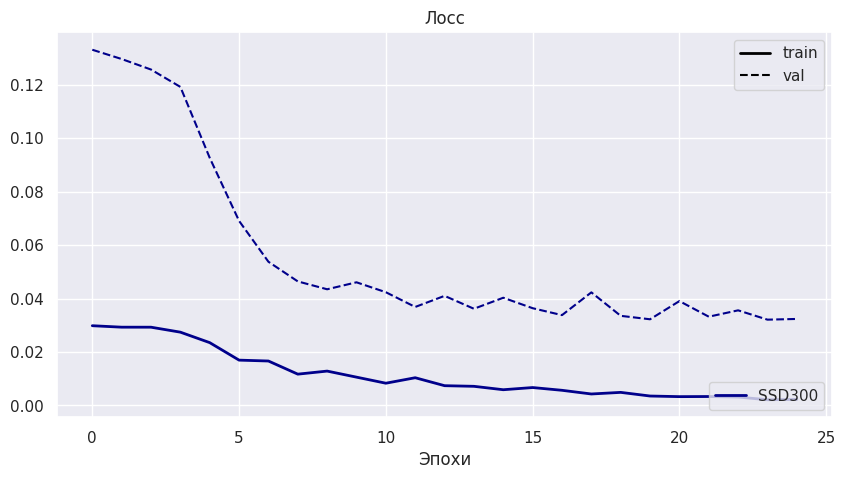

In [20]:
plot_histories([history], ["SSD300"])
plt.show()

#### 3. Инференс и визуализация. (45 баллов)
- Визуализируйте результаты детекции на тестовых данных. Не забудьте, что координаты боксов на выходе будут от 0 до 1. Их нужно умножить на 300.

In [21]:
def reverse_normalization(img, mean, std):
    """
    Выполняет обратную нормализацию изображения.
    """
    img = torch.tensor(img).float()
    mean = torch.tensor(MEAN).view(1, 1, -1)
    std = torch.tensor(STD).view(1, 1, -1)

    img = img * std + mean
    img = img * 255

    return img.clamp(0, 255).byte() 

def plot_predictions(test_loader, model, classes):
    '''Строит предсказания model для нескольких картинок из dataset
    * classes -- метки классов'''
    model = model.to(device)
    model.eval()

    with torch.no_grad():
        train_iter = iter(test_loader)
        images, boxes, labels = next(train_iter)

        images = images.to(device)  # (N, 3, 300, 300)

        predicted_locs, predicted_scores = model(images)

        det_boxes_batch, det_labels_batch, det_scores_batch = model.detect_objects(
            predicted_locs, predicted_scores, min_score=0.01, max_overlap=0.45, top_k=200
        )

        boxes = [b.cpu() for b in boxes]
        labels = [l.cpu() for l in labels]

        det_boxes_batch = [box.cpu() for box in det_boxes_batch]
        det_labels_batch = [label.cpu() for label in det_labels_batch]
        det_scores_batch = [score.cpu() for score in det_scores_batch]

        # Create a 2x2 grid of images
        fig, axes = plt.subplots(2, 2, figsize=(12, 12))
        axes = axes.flatten()

        # Loop through 4 images and display each
        for i in range(4):
            ax = axes[i]

            # Отображаем первое изображение из батча
            image = images[i].cpu().numpy().transpose((1, 2, 0))  # преобразуем в numpy (H, W, C)
            #mean = (0.485, 0.456, 0.406)
            #std = (0.229, 0.224, 0.225)
            img_restored = reverse_normalization(image, MEAN, STD)
            ax.imshow(img_restored)

            # Отображаем bounding boxes для детекций
            plot_boxes(det_boxes_batch[i] * 300, det_labels_batch[i], classes,
                       ax, edgecolor='r', scores=det_scores_batch[i], threshold=0.2)

            # Отображаем истинные объекты (bounding boxes)
            plot_boxes(boxes[i] * 300, labels[i], classes, ax, edgecolor='g')

            # Remove grid for each subplot
            ax.grid(False)
            ax.set_yticks([])
            ax.set_xticks([])

        plt.show()

/home/vadim/Documents/fedya/5 sem/ML 13 - detection/model.py:501: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/IndexingUtils.h:27.)
  image_boxes.append(class_decoded_locs[1 - suppress])
/home/vadim/Documents/fedya/5 sem/ML 13 - detection/model.py:503: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/IndexingUtils.h:27.)
  image_scores.append(class_scores[1 - suppress])


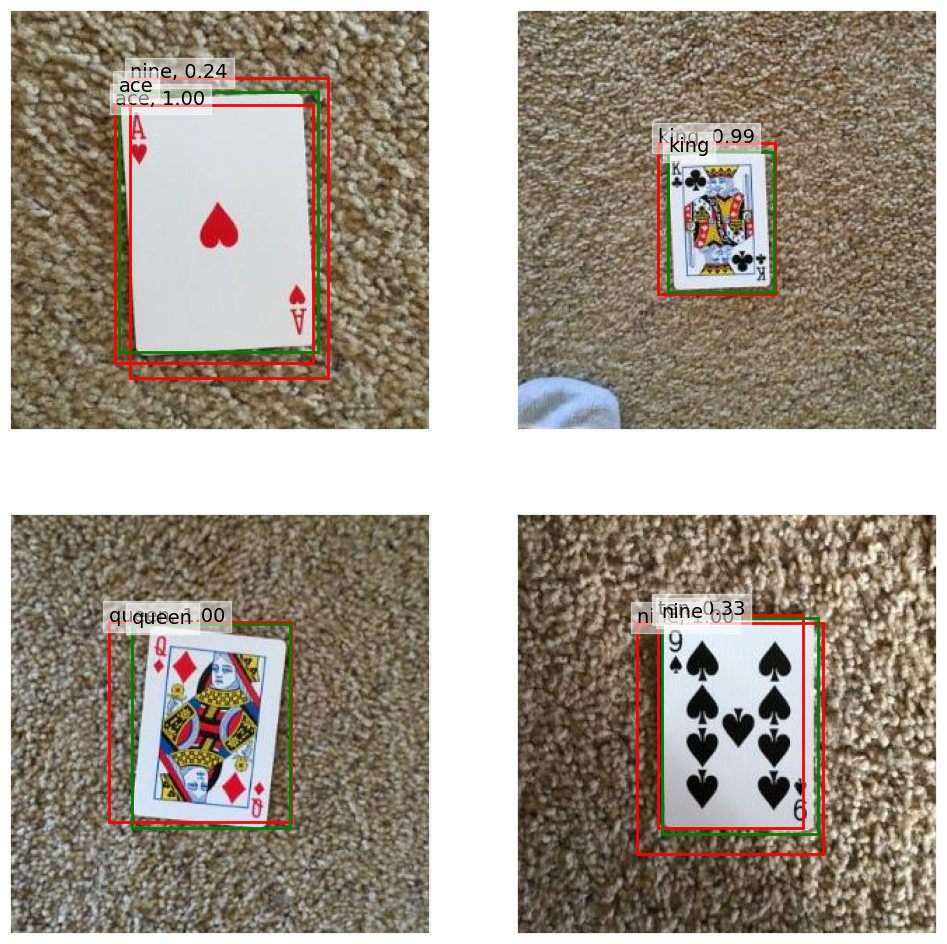

In [22]:
import matplotlib.patches as patches
plot_predictions(test_dataloader, model, classes)

- Посчитайте mAP, пример см. в семинаре.

Класс для подсчета

In [23]:
class MeanAveragePrecision:
    def __init__(self, iou_threshold=0.5):
        """
        Инициализация класса для подсчета mAP.
        
        :param iou_threshold: Минимальное значение IoU для определения совпадения.
        """
        self.iou_threshold = iou_threshold
        self.data = []

    def _calculate_iou(self, box_a, box_b):
        """
        Вычисление Intersection over Union (IoU) между двумя прямоугольниками.
        
        :param box_a: Координаты первого прямоугольника [x1, y1, x2, y2].
        :param box_b: Координаты второго прямоугольника [x1, y1, x2, y2].
        :return: Значение IoU.
        """
        x_left = max(box_a[0], box_b[0])
        y_top = max(box_a[1], box_b[1])
        x_right = min(box_a[2], box_b[2])
        y_bottom = min(box_a[3], box_b[3])

        if x_right <= x_left or y_bottom <= y_top:
            return 0.0

        intersection_area = (x_right - x_left) * (y_bottom - y_top)
        area_a = (box_a[2] - box_a[0]) * (box_a[3] - box_a[1])
        area_b = (box_b[2] - box_b[0]) * (box_b[3] - box_b[1])
        union_area = area_a + area_b - intersection_area

        return intersection_area / union_area if union_area > 0 else 0.0

    def update(self, gt_boxes, pred_boxes_with_scores):
        """
        Сохранение данных для последующего подсчета метрики.
        
        :param gt_boxes: Список ground truth боксов
        в формате [[x1, y1, x2, y2], ...].
        :param pred_boxes_with_scores: Список предсказанных боксов с вероятностями
        в формате [[x1, y1, x2, y2, score], ...].
        """
        self.data.append({
            "ground_truth": gt_boxes,
            "predictions": sorted(pred_boxes_with_scores, key=lambda x: x[4], reverse=True)
        })

    def compute(self):
        """
        Вычисление средней точности (mAP) по сохраненным данным.
        
        :return: Значение mAP.
        """
        if not self.data:
            return 0.0
    
        average_precisions = []
    
        for entry in self.data:
            gt_boxes = entry["ground_truth"]
            pred_boxes = entry["predictions"]
    
            matched_gt = set()
            tp, fp = 0, 0
            precisions = []
            recalls = []
    
            # Сортируем предсказания по вероятности (score)
            pred_boxes = sorted(pred_boxes, key=lambda x: x[4], reverse=True)
    
            for pred_box in pred_boxes:
                max_iou = 0
                best_gt_idx = -1
    
                for idx, gt_box in enumerate(gt_boxes):
                    if idx in matched_gt:
                        continue
    
                    iou = self._calculate_iou(pred_box[:4], gt_box)
                    if iou > max_iou:
                        max_iou = iou
                        best_gt_idx = idx
    
                if max_iou >= self.iou_threshold:
                    tp += 1
                    matched_gt.add(best_gt_idx)
                else:
                    fp += 1
    
                precision = tp / (tp + fp + 1e-15)
                recall = tp / (len(gt_boxes) + 1e-15)
                precisions.append(precision)
                recalls.append(recall)
    
            ap = 0
            for t in np.linspace(0, 1, 11):
                precisions_at_t = [p for p, r in zip(precisions, recalls) if r >= t]
                if precisions_at_t:
                    ap += max(precisions_at_t)
                else:
                    ap += 0
    
            ap /= 11
            average_precisions.append(ap)
    
        return np.mean(average_precisions) if average_precisions else 0.0


Реализация подсчета

In [24]:
def get_mAP(dataset, model, device):
    """
    Подсчитывает статистику Mean Average Precision для model на dataset
    """
    model.eval()
    map_calculator = MeanAveragePrecision(iou_threshold=0.5)

    all_gt_boxes = []
    all_predictions = []
    for i, item in enumerate(tqdm(dataset)):
        image, gt_boxes, gt_labels = item

        image = image.to(device)
        gt_boxes = gt_boxes.numpy()
        gt_labels = gt_labels.numpy()

        with torch.no_grad():
            predicted_locs, predicted_scores = model(image.unsqueeze(dim=0))

            det_boxes_batch, det_labels_batch, det_scores_batch = model.detect_objects(
                predicted_locs, predicted_scores, min_score=0.01, max_overlap=0.45, top_k=200
            )

        det_boxes = det_boxes_batch[0].cpu().numpy()
        det_scores = det_scores_batch[0].cpu().numpy()
        det_predictions = [list(box) + [score] for box, score in zip(det_boxes, det_scores)]

        all_gt_boxes.extend(list(gt_boxes))
        all_predictions.extend(list(det_predictions))

    map_calculator.update(all_gt_boxes, all_predictions)

    return map_calculator.compute()

Итого

In [25]:
round(get_mAP(test_dataset, model, device), 3)

  0%|          | 0/67 [00:00<?, ?it/s]

0.885

- Посчитайте и визуализируйте матрицу ошибок (Confusion Matrix) на тестовых данных. Для подсчета матрицы используйте [реализацию CM из sklearn](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html), для визуализации &mdash; [heatmap из seaborn](https://seaborn.pydata.org/generated/seaborn.heatmap.html).

In [26]:
from sklearn.metrics import confusion_matrix

def get_confusion_matrix(dataset, model, iou_threshold=0.5, matrix_labels=list(range(8)),
                         top_k=50, min_score=0.5, max_overlap=0.5):
    """
    Получает confusion matrix.

    :param dataset: Датасет для тестирования модели.
    :param model: Обученная модель для генерации предсказаний.
    :param iou_threshold: Порог IoU для выделения соответствий предсказаний и ground truth.
    :param matrix_labels: Метки классов.
    :param top_k: Максимальное количество предсказаний.
    :param min_score: Минимальный порог для фильтрации боксов.
    :param max_overlap: Максимальное перекрытие (для NMS).
    :return: Confusion Matrix (cm).
    """
    y_true = []  # Список истинных меток
    y_pred = []  # Список предсказанных меток

    model.eval()
    map_calculator = MeanAveragePrecision(iou_threshold=iou_threshold)

    for item in dataset:
        image, gt_boxes, gt_labels = item
        image = image.to(device)

        # Получаем предсказания
        with torch.no_grad():
            predicted_locs, predicted_scores = model(image.unsqueeze(dim=0))

            det_boxes_batch, det_labels_batch, det_scores_batch = model.detect_objects(
                predicted_locs, predicted_scores, 
                min_score=min_score, max_overlap=max_overlap, top_k=top_k
            )

        gt_labels = gt_labels.numpy()
        det_labels = det_labels_batch[0].cpu().numpy()
        det_boxes = det_boxes_batch[0].cpu().numpy()

        # Соответствие предсказаний и ground truth (с IoU > threshold)
        matched_gt = set()
        for pred_box, pred_label in zip(det_boxes, det_labels):
            best_iou = 0
            best_gt_idx = -1

            for gt_idx, gt_box in enumerate(gt_boxes):
                if gt_idx in matched_gt:
                    continue
                iou = map_calculator._calculate_iou(pred_box, gt_box)
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = gt_idx

            if best_iou >= iou_threshold:
                matched_gt.add(best_gt_idx)
                y_true.append(gt_labels[best_gt_idx])
                y_pred.append(pred_label)
            else:
                y_pred.append(pred_label)
                y_true.append(0)  # Считаем false positive как "фон"

        # Добавляем оставшиеся не предсказанные боксы в y_true как "фон"
        unmatched_gt = set(range(len(gt_boxes))) - matched_gt
        for idx in unmatched_gt:
            y_true.append(gt_labels[idx])
            y_pred.append(0)  # Считаем unmatched ground truth как "фон"

    # Подсчитываем матрицу ошибок
    cm = confusion_matrix(y_true, y_pred, labels=matrix_labels)
    return cm

def plot_confusion_matrix(
    dataset, model, display_labels,
    iou_threshold=0.5, matrix_labels=list(range(1, 8)),
    top_k=50, min_score=0.5, max_overlap=0.5
):
    """
    Визуализирует confusion matrix.

    :param dataset: Датасет для тестирования модели.
    :param model: Обученная модель.
    :param display_labels: Лейблы для отображения на графике.
    """
    cm = get_confusion_matrix(
        dataset, model, iou_threshold=iou_threshold, 
        matrix_labels=matrix_labels, top_k=top_k, 
        min_score=min_score, max_overlap=max_overlap
    )
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm, annot=True, fmt='d', cmap='Blues', 
        xticklabels=display_labels, yticklabels=display_labels
    )
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()


In [27]:
classes[1:]

['nine', 'ten', 'jack', 'queen', 'king', 'ace', 'bg']

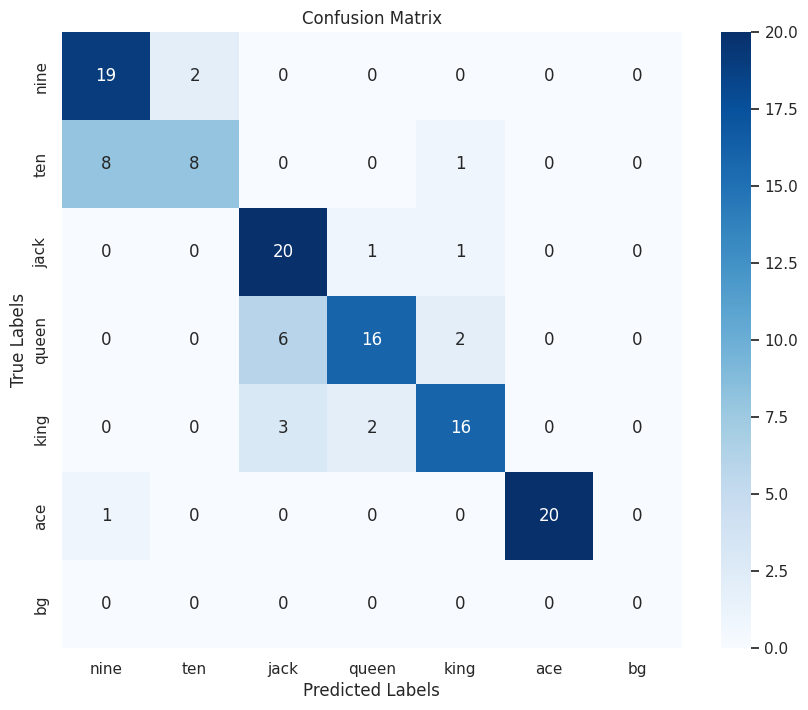

In [28]:
plot_confusion_matrix(test_dataset, model, display_labels=classes[1:])

**Вывод:**

Заметно, что карты с номиналом 9 часто путаются с картами 10, а королевы — с картами вальтов и королей. ace - самый точный.
Для улучшения точности модели стоит обратить внимание на карты, которые путаются друг с другом, и возможно провести дополнительное обучение с увеличением разнообразия примеров карт, например добавить больше карт с цифрами (9 и 10 похожи потому что там числа на картах), а также для валета, королевы и короля.

Вообще модель хорошо справляестя с предсказаниями, 0.853 mAP

#### 4. Маленькие карты

Уменьшим карты на картинках. Для этого будем случайно собирать 4 изображения из датасета и соединять их в коллаж, тем самым получая изображение с более мелкими объектами. Можно использовать и другие способы уменьшения, но данный способ, на взгляд автора, дает более реалистичные изображения и не очень трудозатратный.

**здесь ошибка у составителей - боксы переносятся некорректно**

In [52]:
def get_smaller_images(images, old_boxes):
    """
    Уменьшает изображения и соотвествующие ему боксы.
 
    :param images -- изображения, их должно быть 4
    :param boxes -- боксы, соотвествующие каждому изображению
    """
    image = torch.zeros((3, 300, 300))
    boxes = []
 
    transform = transforms.Resize((150, 150))
    for i, j in zip([0, 0, 1, 1], [0, 1, 0, 1]):
        image[:, 150 * i: 150 * (i + 1), 150 * j: 150 * (j + 1)] = transform(images[i * 2 + j])
        for box in old_boxes[i * 2 + j]:
            x_min, y_min, x_max, y_max = box * 0.5
            x_min += j * 0.5
            x_max += j * 0.5
            y_min += i * 0.5
            y_max += i * 0.5
            boxes.append([x_min, y_min, x_max, y_max])
 
    return image, boxes

Создадим целую папку с изображениями, уменьшенными выше описанным способом.

In [53]:
res_dir = "small_images"
# Создаем папку, если ее нет
os.makedirs(res_dir, exist_ok=True)
 
totensor = transforms.ToTensor()
 
for part in ["train", "test"]:
    # Создаем папку, если ее нет
    os.makedirs(os.path.join(res_dir, part), exist_ok=True)
 
    # Названия файлов с картинками и таблица с разметкой
    files = os.listdir(os.path.join(dir, part))
    data = pd.read_csv(os.path.join(dir, f"{part}_labels.csv"))
    new_data_rows = []  # Список для строк новой таблицы
    print(f"Количество изображений в исходных {part} данных: {len(files)}")
 
    if part == "train":
        num_images = 300
    else:
        num_images = 70
 
    for i in range(num_images):  # Заменено на num_images
 
        # Собираем 4 изображения
        n = 0
        images, all_boxes, all_labels = [], [], []
        while n < 4:
            file = np.random.choice(files)
            if file[-4:].lower() != ".jpg":
                continue
            
            image = totensor(Image.open(os.path.join(dir, part, file)))
            labels, boxes = get_file_labels_boxes(data, file)
            images.append(image)
            # Переводим боксы в относительную шкалу
            boxes /= 300
            all_boxes.append(boxes)
            all_labels.extend(labels)
            n += 1
        
        # Собираем одну картинку из нескольких маленьких
        image, boxes = get_smaller_images(images, all_boxes)
        boxes = [[float(c) * 300 for c in box] for box in boxes]
 
        # Сохраняем результат
        filename = f'image{i}.jpg'
        # Нормализуем значения изображения перед сохранением
        plt.imsave(os.path.join(res_dir, part, filename), image.permute(1, 2, 0).numpy().clip(0, 1))

 
        for box, label in zip(boxes, all_labels):
            new_data_rows.append({'filename': filename, 'class': classes[label],
                                  'xmin': box[0], 'ymin': box[1], 'xmax': box[2], 'ymax': box[3]})
    
    # Создаем DataFrame из списка строк и сохраняем его
    new_data = pd.DataFrame(new_data_rows)
    new_data.to_csv(os.path.join(res_dir, f"{part}_labels.csv"), index=False)


Количество изображений в исходных train данных: 593
Количество изображений в исходных test данных: 134


Посмотрим, что получилось.

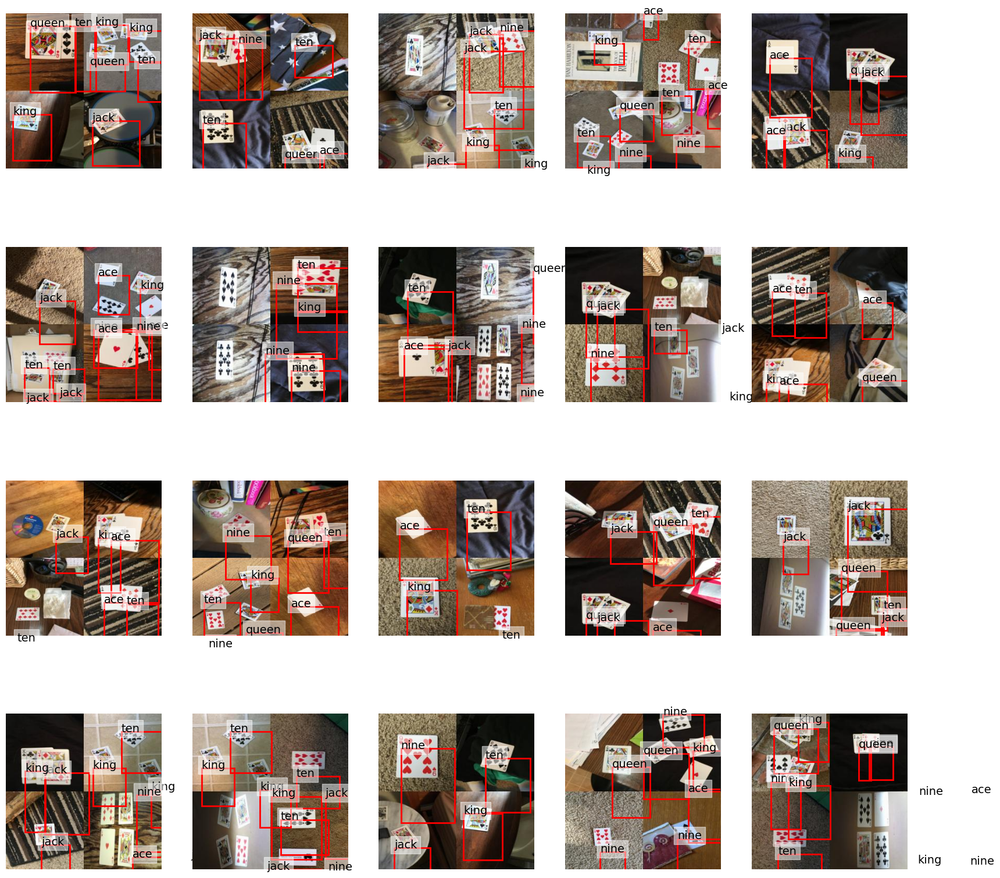

In [54]:
files = os.listdir("small_images/train")
data = pd.read_csv("small_images/train_labels.csv")

fig, axes = plt.subplots(4, 5, figsize=(20,20))

# Итератор по изображениям
i = 0
# Итератор по файлам
j = 0
while i < 20:

    file = files[j]
    j += 1

    # Выбираем только картинки
    if file[-4:].lower() != ".jpg":
        continue
    img = Image.open(os.path.join("small_images/train", file))

    # Получаем лейблы и боксы, соотв. картинке
    labels, boxes = get_file_labels_boxes(data, file)

    # Визуализируем
    ax = axes[i // 5, i % 5]
    ax.imshow(img)
    plot_boxes(boxes, labels, classes, ax)
    ax.axis("off")

    i += 1

#### 5. Тестирование SSD на маленьких картах (10 баллов)

На новом теством датасете с маленькими картами:
- визуализируйте предсказания обученной модели
- посчитайте mAP
- визуализируйте Confusion Matrix

In [29]:
small_dataset = PlayingCardsDataset(
    images_path="small_images/test",
    data_path="small_images/test_labels.csv"
)
small_test_dataloader = DataLoader(small_dataset, batch_size=batch_size,
                         shuffle=False, pin_memory=False,
                         collate_fn=collate_fn) 

Визуализируем

/home/vadim/Documents/fedya/5 sem/ML 13 - detection/model.py:501: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/IndexingUtils.h:27.)
  image_boxes.append(class_decoded_locs[1 - suppress])
/home/vadim/Documents/fedya/5 sem/ML 13 - detection/model.py:503: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/IndexingUtils.h:27.)
  image_scores.append(class_scores[1 - suppress])


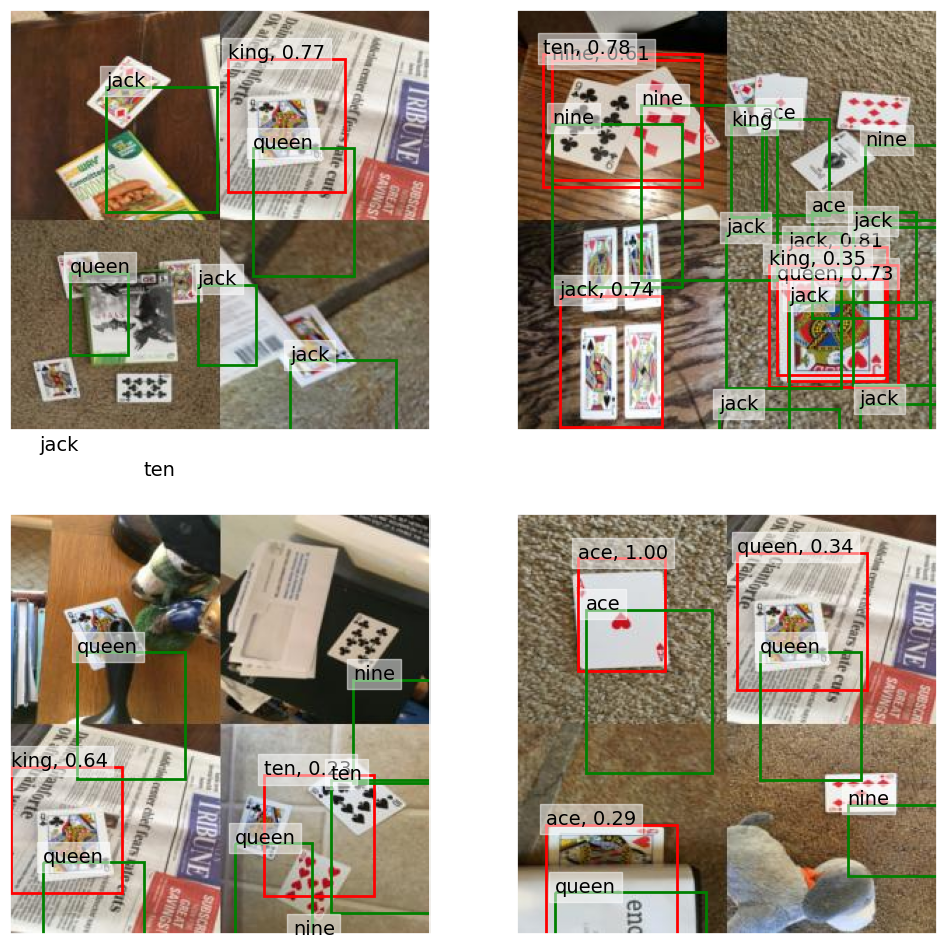

In [30]:
plot_predictions(small_test_dataloader, model, classes)

Подсчет mAP

In [31]:
round(get_mAP(small_dataset, model, device), 3)

  0%|          | 0/70 [00:00<?, ?it/s]

0.101

Матрица корреляций

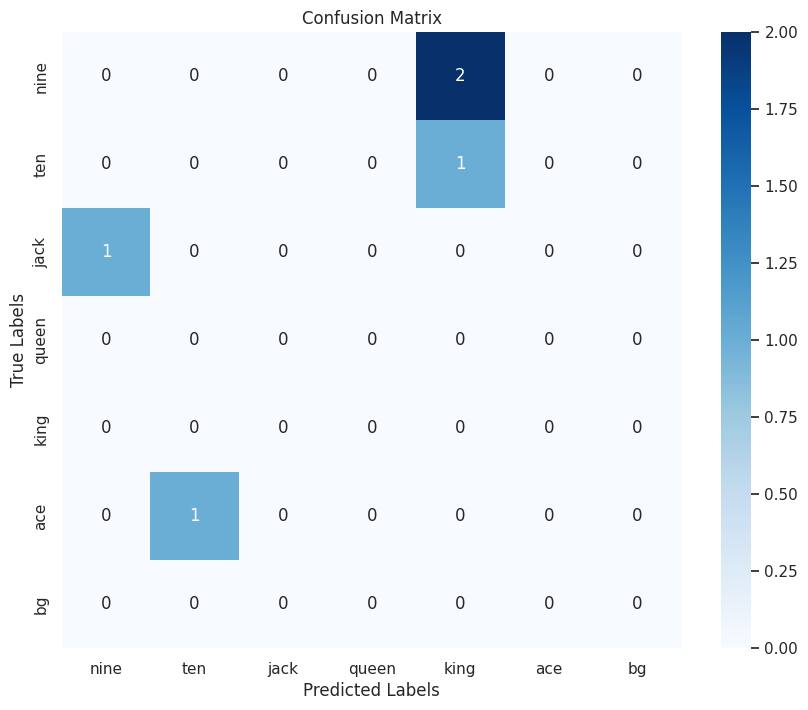

In [32]:
plot_confusion_matrix(small_dataset, model, display_labels=classes[1:])

**Вывод**

Боксы некорректные у составителей


Модель обучалась под распознавание на картинке больших карт, поэтому она плохо будет работать на уменьшенных картинках. Во-первых, она может воспринять две карты как одну целую. Аналогично она плохо определяет плохо границы карт, расположенных рядом. 

#### 6. Улучшение качества распознавания для более мелких объектов (65 баллов)

Смешаем обычные картинки и наши уменьшенные. Будем использовать такую смесь для дообучения модели.

In [ ]:
! mkdir normal_and_small_images normal_and_small_images/train
! cp cropped_images/train/* normal_and_small_images/train -R -n -v
! cp small_images/train/* normal_and_small_images/train -R -n -v
! mkdir normal_and_small_images normal_and_small_images/test
! cp cropped_images/train/* normal_and_small_images/test -R -n -v
! cp small_images/train/* normal_and_small_images/test -R -n -v

Пересчет лейблов

In [33]:
data = pd.read_csv('cropped_images/train_labels.csv', index_col=0)[['filename', 'class', 'xmin', 'ymin', 'xmax', 'ymax']]
tmp_df = pd.read_csv('small_images/train_labels.csv', index_col=0).reset_index()
data = pd.concat([data, tmp_df])
data.to_csv("normal_and_small_images/train_labels.csv")

data = pd.read_csv('cropped_images/test_labels.csv', index_col=0)[['filename', 'class', 'xmin', 'ymin', 'xmax', 'ymax']]
tmp_df = pd.read_csv('small_images/test_labels.csv', index_col=0).reset_index()
data = pd.concat([data, tmp_df])
data.to_csv("normal_and_small_images/test_labels.csv")


Определение датасетов

In [34]:
train_batch_size = 16
train_dataset = PlayingCardsDataset(
    images_path="normal_and_small_images/train",
    data_path="normal_and_small_images/train_labels.csv"
)
train_dataloader = DataLoader(
  train_dataset, batch_size=train_batch_size, shuffle=True, pin_memory=False, collate_fn=collate_fn)

test_batch_size = 16
test_dataset = PlayingCardsDataset(
    images_path="normal_and_small_images/test",
    data_path="normal_and_small_images/test_labels.csv"
)
test_dataloader = DataLoader(
  train_dataset, batch_size=test_batch_size, shuffle=False, pin_memory=False, collate_fn=collate_fn)

Из feature map $FM\ 7$ размера 19x19(x1024) с помощью ряда сверток получим набор дополнительных feature map $FM\ 8_2$, $FM\ 9_2$, $FM\ 10_2$, $FM\ 11_2$ разных размеров: 10x10(x512), 5x5(x256), 3x3(x256) и 1x1(x256). Этот ряд сверток состоит из блоков сверток из 2 слоев каждый. Понижение размерности в здесь достигается путем применения stride = 2.  

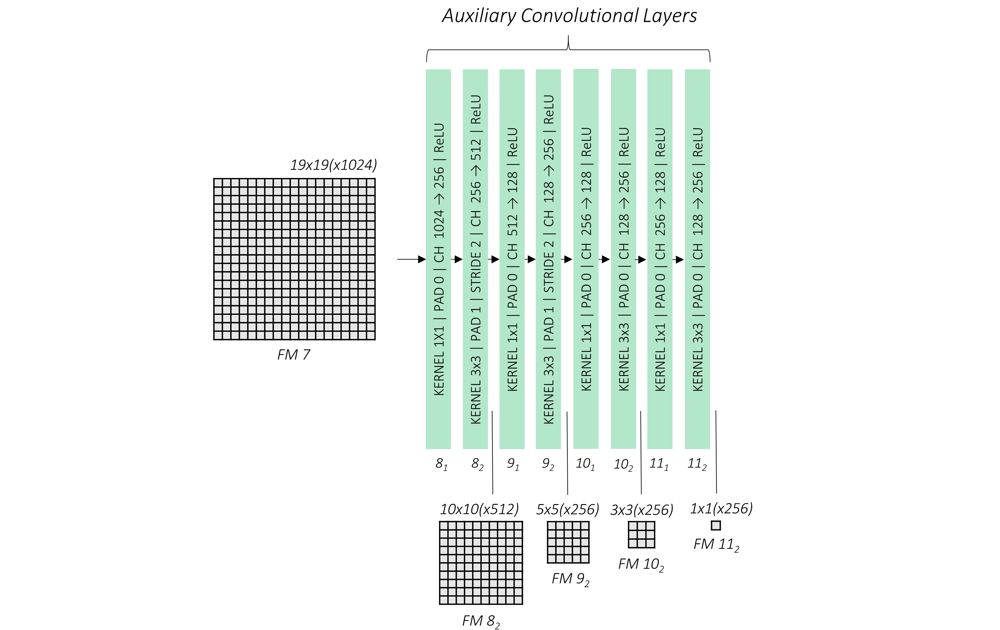

* Измените архитектуру модели. Добавьте обратные свертки после последнего слоя `conv_11_2` в классе `AuxiliaryConvolutions`. Выходы полученных сверток нужно сделать такого же размера как feature-map-ы. Объедините их с соответствующими feature-map-ами, а результат объединения прогоните через слой conv с ядром 1x1, для каждого объединения отдельно. На выходе должны получиться новые feature-map-ы такого же размера как и до изменения архитектуры. На картинке &mdash; возможный вариант такой модификации:


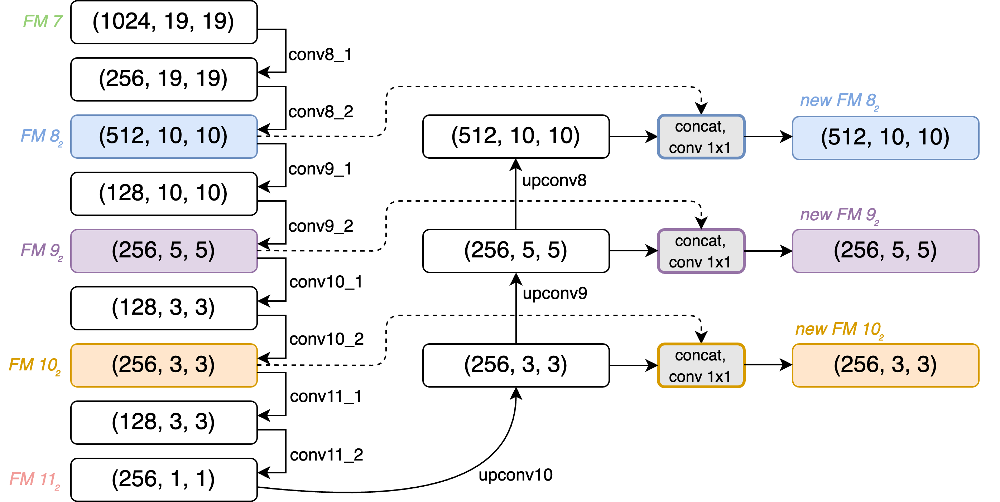

Инициализация модели и параметров

In [35]:
from new_model_updated import *

model_new = SSD300(n_classes=n_classes)
model_new = model_new.to(device)

/home/vadim/DS-env/lib64/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/vadim/DS-env/lib64/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)



Loaded base model.



Не забудьте пояснять, где и что вы изменили, если делаете изменения в .py файле и потом импортируете.

Изменения в этом классе

class AuxiliaryConvolutions(nn.Module):
    """
    Additional convolutions to produce higher-level feature maps.
    """

    def __init__(self):
        super(AuxiliaryConvolutions, self).__init__()

        # Auxiliary/additional convolutions on top of the VGG base
        self.conv8_1 = nn.Conv2d(1024, 256, kernel_size=1, padding=0)  # stride = 1, by default
        self.conv8_2 = nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1)  # dim. reduction because stride > 1

        self.conv9_1 = nn.Conv2d(512, 128, kernel_size=1, padding=0)
        self.conv9_2 = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)  # dim. reduction because stride > 1

        self.conv10_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv10_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)  # dim. reduction because padding = 0

        self.conv11_1 = nn.Conv2d(256, 128, kernel_size=1, padding=0)
        self.conv11_2 = nn.Conv2d(128, 256, kernel_size=3, padding=0)  # dim. reduction because padding = 0

        # Новые ConvTranspose2d и Conv2d
        self.upconv10 = nn.ConvTranspose2d(256, 256, kernel_size=3, stride=2, padding=0)
        self.upconv9 = nn.ConvTranspose2d(256, 256, kernel_size=3, stride=2, padding=1)
        self.upconv8 = nn.ConvTranspose2d(512, 512, kernel_size=3, stride=2, padding=1)

        self.refine_conv8 = nn.Conv2d(1024, 512, kernel_size=1, padding=0)
        self.refine_conv9 = nn.Conv2d(512, 256, kernel_size=1, padding=0)
        self.refine_conv10 = nn.Conv2d(512, 256, kernel_size=1, padding=0)
        
        # Initialize convolutions' parameters
        self.init_conv2d()

    def init_conv2d(self):
        """
        Initialize convolution parameters.
        """
        for c in self.children():
            if isinstance(c, nn.Conv2d):
                nn.init.xavier_uniform_(c.weight)
                nn.init.constant_(c.bias, 0.)

    def forward(self, conv7_feats):
        """
        Forward propagation.

        :param conv7_feats: lower-level conv7 feature map, a tensor of dimensions (N, 1024, 19, 19)
        :return: higher-level feature maps conv8_2, conv9_2, conv10_2, and conv11_2
        """
        out = F.relu(self.conv8_1(conv7_feats))  # (N, 256, 19, 19)
        out = F.relu(self.conv8_2(out))  # (N, 512, 10, 10)
        conv8_2_feats = out  # (N, 512, 10, 10)

        out = F.relu(self.conv9_1(out))  # (N, 128, 10, 10)
        out = F.relu(self.conv9_2(out))  # (N, 256, 5, 5)
        conv9_2_feats = out  # (N, 256, 5, 5)

        out = F.relu(self.conv10_1(out))  # (N, 128, 5, 5)
        out = F.relu(self.conv10_2(out))  # (N, 256, 3, 3)
        conv10_2_feats = out  # (N, 256, 3, 3)

        out = F.relu(self.conv11_1(out))  # (N, 128, 3, 3)
        conv11_2_feats = F.relu(self.conv11_2(out))  # (N, 256, 1, 1)

        # Применение новых ConvTranspose2d и Conv2d
        upconv10_feats = F.relu(self.upconv10(conv11_2_feats))  # (N, 256, 3, 3)
        new_conv10_2_feats = F.relu(self.refine_conv10(torch.cat([conv10_2_feats, upconv10_feats], dim=1)))  # (N, 256, 3, 3)

        upconv9_feats = F.relu(self.upconv9(new_conv10_2_feats))  # (N, 256, 5, 5)
        new_conv9_2_feats = F.relu(self.refine_conv9(torch.cat([conv9_2_feats, upconv9_feats], dim=1)))  # (N, 256, 5, 5)

        upconv8_feats = F.relu(self.upconv8(new_conv9_2_feats))  # (N, 512, 10, 10)
        new_conv8_2_feats = F.relu(self.refine_conv8(torch.cat([conv8_2_feats, upconv8_feats], dim=1)))  # (N, 512, 10, 10)

        # Higher-level feature maps
        # Изменил выход
        return new_conv8_2_feats, new_conv9_2_feats, new_conv10_2_feats, conv11_2_feats

* Обучите модель с измененной архитектурой, постройте график лосса.

Для обучения

In [38]:
lr = 1e-3
momentum = 0.9
weight_decay = 5e-4

criterion = MultiBoxLoss(priors_cxcy=model_new.priors_cxcy).to(device)

biases = list()
not_biases = list()
for param_name, param in model_new.named_parameters():
    if param.requires_grad:
        if param_name.endswith('.bias'):
            biases.append(param)
        else:
            not_biases.append(param)
optimizer = torch.optim.SGD(params=[{'params': biases, 'lr': 2 * lr}, {'params': not_biases}],
                                    lr=lr, momentum=momentum, weight_decay=weight_decay)

Обучение

In [39]:
num_epochs = 10
history = train(train_loader=train_dataloader,
                test_loader=test_dataloader,
                model=model_new, 
                criterion=criterion,
                optimizer=optimizer,
                num_epochs=num_epochs,
                device=device)

Epoch 10 of 10. Total time 144.743s
  training loss (in-iteration): 	4.935329
  validation loss (in-iteration): 	4.545456


И визуализация

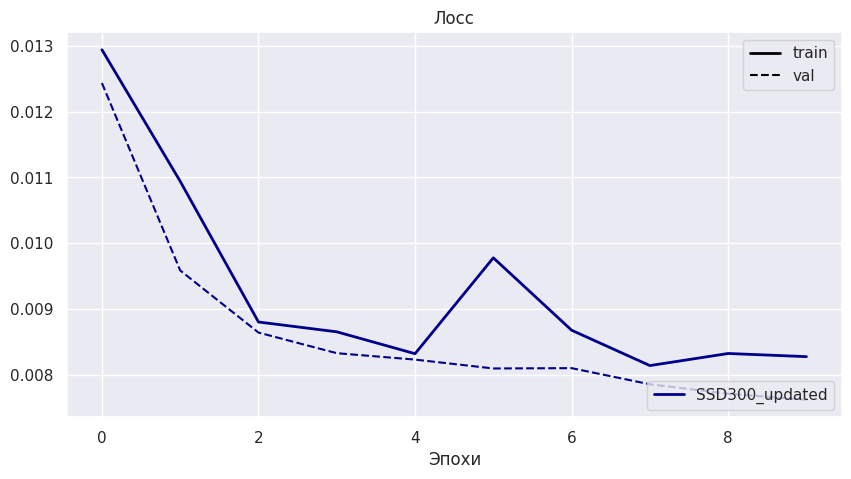

In [40]:
plot_histories([history], ["SSD300_updated"])
plt.show()

* Проверьте, улучшилось ли качество при использовании такой модели (визуализация предсказаний, mAP, Confusion Matrix).

In [41]:
round(get_mAP(test_dataset, model_new, device), 3)

  0%|          | 0/596 [00:00<?, ?it/s]

/home/vadim/Documents/fedya/5 sem/ML 13 - detection/model.py:501: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/IndexingUtils.h:27.)
  image_boxes.append(class_decoded_locs[1 - suppress])
/home/vadim/Documents/fedya/5 sem/ML 13 - detection/model.py:503: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at ../aten/src/ATen/native/IndexingUtils.h:27.)
  image_scores.append(class_scores[1 - suppress])


0.223

Визуализация предсказаний

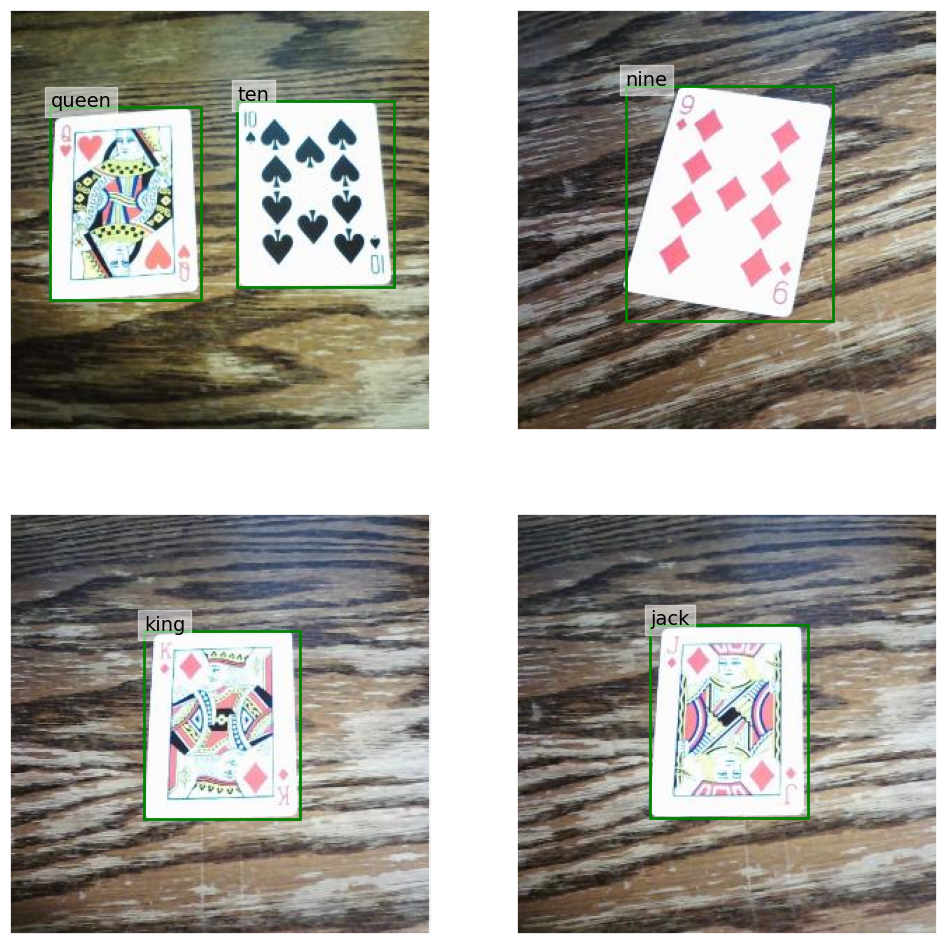

In [42]:
plot_predictions(test_dataloader, model_new, classes)

Confusion Matrix

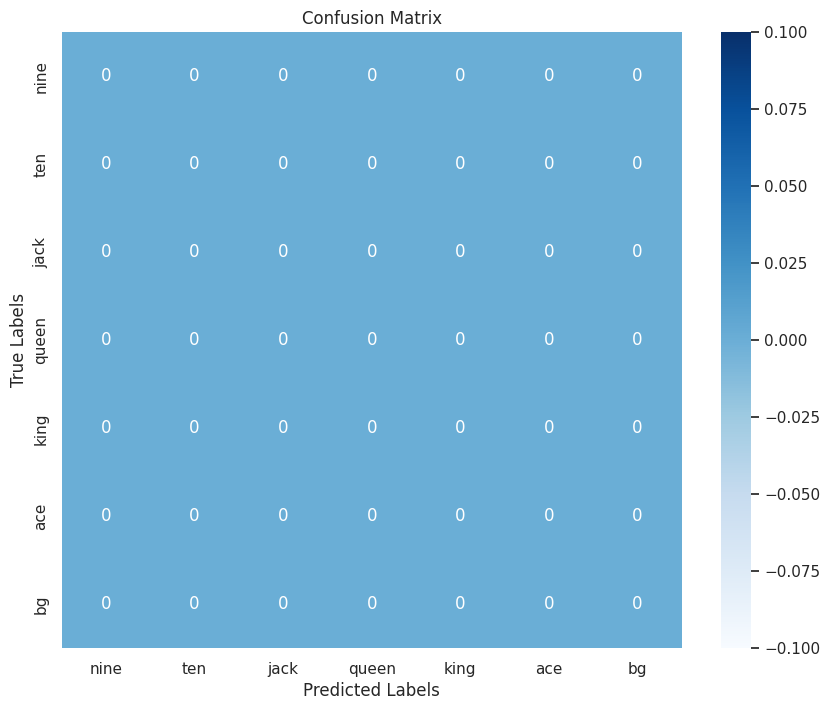

In [43]:
plot_confusion_matrix(test_dataset, model_new, display_labels=classes[1:])

**Вывод**  

Предсказание нулевое - не улучшилась : разметка плохая, а слои только лучше это поняли - соответственно ничего не проходит порог

#### 7. Применение модели в реальной жизни (10 баллов)
Примените лучшую модель к своим фото карт, главное, не берите фото из тренировочных и тестовых данных. Оцените качество визуально.

Картинка

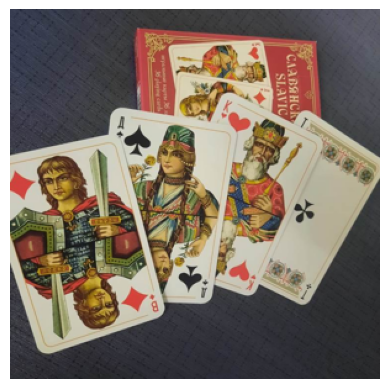

In [60]:
img = Image.open("cards_mine.jpg").resize((300, 300))

plt.imshow(img)
plt.axis('off')
plt.show()

Предсказание

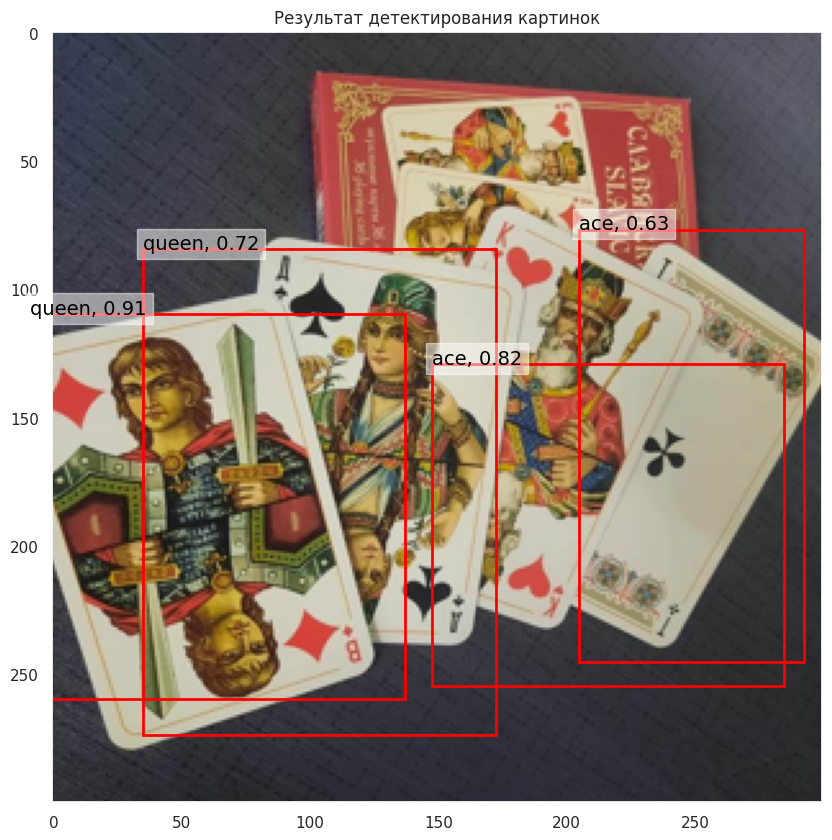

In [74]:
transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=MEAN, std=STD)])

img_for_model = transform(img).unsqueeze(0).to(device)

with torch.no_grad():
    predictions = model(img_for_model)
    detected_boxes, detected_labels, detected_scores = model.detect_objects(*predictions, min_score=0.01, max_overlap=0.5, top_k=200)

image_for_plot = img_for_model.squeeze(0).permute(1, 2, 0).cpu().numpy()

fig, ax = plt.subplots(figsize=(10, 10)) 

ax.imshow(img)
plot_boxes(boxes=detected_boxes[0].cpu() * 300,
    labels=detected_labels[0].cpu(),
    classes=classes, ax=ax,
    scores=detected_scores[0].cpu(), threshold=0.4)

ax.set_title("Результат детектирования картинок")
ax.grid(False)
plt.show()

Вывод:

Модель видит карты, но они нестандартные, не совсем правильно их классифицирует. Так же плохо с границами из за наложения карт

#### 8. Вывод по всей задаче (5 баллов)

Можно улучшить модель научить распозновать малые размеры картинок путем улучшением связи слоев в модели

Мы научились детектировать объекты на изображении